<a href="https://colab.research.google.com/github/yrodriguezmd/IceVision_in_the_works/blob/main/IV_plant_gdrive_try1%2C_csv%2C_custom_parser_2021_8_30_6am.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-08-30 12:35:41--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1244 (1.2K) [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]   1.21K  --.-KB/s    in 0s      

2021-08-30 12:35:41 (62.9 MB/s) - ‘install_colab.sh’ saved [1244/1244]

Installing icevision + dependencices for CUDA 10
Uninstalling some dependencies to prevent errors
Found existing installation: torchvision 0.10.0+cu102
Uninstalling torchvision-0.10.0+cu102:
  Successfully uninstalled torchvision-0.10.0+cu102
Found existing installation: fastai 1.0.61
Uninstalling fastai-1.0.61:
  Successfully uninstalled fastai-1.0.61
Installing some dependencies to prevent errors
     |██

In [38]:
from icevision.all import *

In [2]:
import icevision
print('icevision v',icevision.__version__)
print('torch v',torch.__version__)
print('torchvision v',torchvision.__version__)

icevision v 0.8.1
torch v 1.8.0+cu101
torchvision v 0.9.0+cu101


In [40]:
%pwd

'/content'

In [41]:
# upload plant tensorflow od csv zip file to Drive
### option make separate folder
from google.colab import drive
drive.mount('/content/gdrive')
# sign-in

Mounted at /content/gdrive


In [42]:
%pwd

'/content'

In [43]:
!ls

'=5.1'	  install_colab.sh     README.roboflow.txt   test
 gdrive   README.dataset.txt   sample_data	     train


In [45]:
data_dir = icedata.load_data('PlantDoc.v1-resize-416x416.tensorflow (1).zip',
                             'plants',
                             dest_dir = '.', 
                             gdrive=True)
data_dir
# TypeError: download() missing 1 required positional argument: 'output'
# with dest dir = . added -> TypeError: download() missing 1 required positional argument: 'output'

TypeError: ignored

In [5]:
!unzip \*.zip  && rm *.zip

Archive:  PlantDoc.v1-resize-416x416.tensorflow (1).zip
 extracting: train/Faske%20Southern%20rust%20of%20corn_jpg.rf.016116db58617610bb259b2965f41589.jpg  
 extracting: train/Slide1_preview_jpg.rf.00f57cfc188631c10e10e2b93a38d296.jpg  
 extracting: train/2017-08-27%2B-%2BLate%2BBlight%2Bon%2BGypsy%2B1_jpg.rf.00584c9d14b6fda3086f9a482675d610.jpg  
 extracting: train/Apple-Scab-image-02_jpg.rf.00cbc9a108dbdaadf4232b5392e3d3c8.jpg  
 extracting: train/24154194959_fd4b42edde_b_jpg.rf.0012f9978a300c5635840700fa784280.jpg  
 extracting: train/2-3%20Gray%20leaf%20spot%20BRUCE_jpg.rf.0040c2e382cf11216938e6f49b7d65ed.jpg  
 extracting: train/Septoria_tomato_Margaret%20B_p8170755_0002_25004_jpg.rf.00ddfef2668a53da256f207f9b844782.jpg  
 extracting: train/d-to-tylv-fo005-14496A31BE70553130A_jpg.rf.017e4558f1b4baeadc32a13beb178a6e.jpg  
 extracting: train/Bacterial-spot-symptoms-on-pepper-leaves-for-web_jpg.rf.01bc16f3b7ba0e4c9fa8c07133a723c6.jpg  
 extracting: train/IMG_6029-001_1500x1500%253E_J

In [6]:
!ls

'=5.1'		    README.dataset.txt	  sample_data   train
 install_colab.sh   README.roboflow.txt   test


In [ ]:
#pd.read_csv('_annotations.csv', sep = ',')
# ParserError: Error tokenizing data. C error: Expected 8 fields in line 3367, saw 11
# looking at line 3367: also with width, height 075 --> remove

In [8]:
import pandas as pd
train_labels = pd.read_csv('/content/train/_annotations.csv', sep = ',', error_bad_lines=False)
train_labels.rename(columns={'class':'label'}, inplace=True)
train_labels.sample(3)
# with skipped lines 
# filenames different from original(actual names.jpg), width, height different
# wh all 416?

b'Skipping line 3367: expected 8 fields, saw 11\nSkipping line 6070: expected 8 fields, saw 9\nSkipping line 6071: expected 8 fields, saw 9\nSkipping line 6072: expected 8 fields, saw 9\nSkipping line 6073: expected 8 fields, saw 9\nSkipping line 6074: expected 8 fields, saw 9\nSkipping line 6075: expected 8 fields, saw 9\nSkipping line 6076: expected 8 fields, saw 9\nSkipping line 6077: expected 8 fields, saw 9\nSkipping line 6078: expected 8 fields, saw 9\nSkipping line 6079: expected 8 fields, saw 9\nSkipping line 6080: expected 8 fields, saw 9\nSkipping line 6081: expected 8 fields, saw 9\nSkipping line 6082: expected 8 fields, saw 9\nSkipping line 6083: expected 8 fields, saw 9\nSkipping line 6084: expected 8 fields, saw 9\nSkipping line 6085: expected 8 fields, saw 9\nSkipping line 6086: expected 8 fields, saw 9\nSkipping line 6087: expected 8 fields, saw 9\nSkipping line 6088: expected 8 fields, saw 9\nSkipping line 7470: expected 8 fields, saw 9\nSkipping line 7471: expected 8 

,filename,width,height,label,xmin,ymin,xmax,ymax
1487,stock-photo-peach-leaves-isolated-on-white-background-298277570_jpg.rf.2ce91f8464c1ead6efd60c4807a4e57e.jpg,416,416,Peach leaf,95,38,242,153
114,ac-0018_pdf-2_2_jpg.rf.044964ac83324535fd56bd0a05363b2e.jpg,416,416,Soybean leaf,298,214,336,263
3935,6uo5q_jpg.rf.7886006419ce6604c535b4fed6546af2.jpg,416,416,Peach leaf,18,265,147,340


In [19]:
# simpler
import pandas as pd
train_labels = pd.read_csv('./train/_annotations.csv', sep = ',', error_bad_lines=False)
train_labels.rename(columns={'class':'label'}, inplace=True)
train_labels.sample(3)
# with skipped lines 
# filenames different from original(actual names.jpg), width, height different
# wh all 416?

b'Skipping line 3367: expected 8 fields, saw 11\nSkipping line 6070: expected 8 fields, saw 9\nSkipping line 6071: expected 8 fields, saw 9\nSkipping line 6072: expected 8 fields, saw 9\nSkipping line 6073: expected 8 fields, saw 9\nSkipping line 6074: expected 8 fields, saw 9\nSkipping line 6075: expected 8 fields, saw 9\nSkipping line 6076: expected 8 fields, saw 9\nSkipping line 6077: expected 8 fields, saw 9\nSkipping line 6078: expected 8 fields, saw 9\nSkipping line 6079: expected 8 fields, saw 9\nSkipping line 6080: expected 8 fields, saw 9\nSkipping line 6081: expected 8 fields, saw 9\nSkipping line 6082: expected 8 fields, saw 9\nSkipping line 6083: expected 8 fields, saw 9\nSkipping line 6084: expected 8 fields, saw 9\nSkipping line 6085: expected 8 fields, saw 9\nSkipping line 6086: expected 8 fields, saw 9\nSkipping line 6087: expected 8 fields, saw 9\nSkipping line 6088: expected 8 fields, saw 9\nSkipping line 7470: expected 8 fields, saw 9\nSkipping line 7471: expected 8 

,filename,width,height,label,xmin,ymin,xmax,ymax
8322,role-of-whitefly-in-plant-virus-transmission-by-pmanikandan-13-638_jpg.rf.fffc515800d96347136a19a86c40c0d5.jpg,416,416,Tomato leaf yellow virus,241,145,266,215
6190,peach_tree_20100523_jpg.rf.bc6862fd43c25ea5bb88f2ebafdcf52f.jpg,416,416,Peach leaf,78,328,105,350
7910,6898762496_5b9b6c22d3_z_jpg.rf.f2bcc8bfee10a5b590e38bb706896e18.jpg,416,416,Soyabean leaf,341,199,398,291


In [9]:
train_labels.info()
# git 8,469 images, no missing val
# local 8,329 images, no missing val

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8329 entries, 0 to 8328
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8329 non-null   object
 1   width     8329 non-null   int64 
 2   height    8329 non-null   int64 
 3   label     8329 non-null   object
 4   xmin      8329 non-null   int64 
 5   ymin      8329 non-null   int64 
 6   xmax      8329 non-null   int64 
 7   ymax      8329 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 520.7+ KB


In [10]:
train_labels.filename.nunique()
# paper: 2,598 data points
# git: 2345
# local: 2315

2315

In [11]:
train_labels.label.nunique()
# paper: 13 plant species, 17 classes of diseases
# git: 29
# local: 30

30

In [12]:
_CLASSES = train_labels.label.unique().tolist()
_CLASSES

['Corn rust leaf',
 'Corn leaf blight',
 'Tomato leaf late blight',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato mold leaf',
 'Bell_pepper leaf spot',
 'Potato leaf early blight',
 'grape leaf black rot',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Bell_pepper leaf',
 'Apple rust leaf',
 'Tomato leaf bacterial spot',
 'Raspberry leaf',
 'Squash Powdery mildew leaf',
 'Potato leaf late blight',
 'Tomato leaf mosaic virus',
 'Tomato Early blight leaf',
 'Soybean leaf',
 'Tomato leaf',
 'Peach leaf',
 'Soyabean leaf',
 'Corn Gray leaf spot',
 'Apple leaf',
 'Strawberry leaf',
 'Cherry leaf',
 'grape leaf',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

In [13]:
class_map = ClassMap(_CLASSES)

In [14]:
class_map.get_by_name('Apple leaf')
# code to be used in custom parser
# git: 11
# local: 25

25

In [15]:
!ls

'=5.1'		    README.dataset.txt	  sample_data   train
 install_colab.sh   README.roboflow.txt   test


In [16]:
# using VOC format, jpg and xml in one folder
#data_dir = Path('./TRAIN')

# using tf cvs local
#data_dir = Path('/content/train')
data_dir = Path('./train') #

data_dir.ls()
# contains jpg and xml annotations

(#2329) [Path('train/24154194959_fd4b42edde_b_jpg.rf.0012f9978a300c5635840700fa784280.jpg'),Path('train/peach-with-leaves-stock-picture-1662209_jpg.rf.526b2d009dadedc6a78e1d9d98ecc1e4.jpg'),Path('train/guttation-on-the-leaves-of-a-strawberry-plant-leaf-guttation-BN3DM8_jpg.rf.3f3734bf46cdb07759667c93b24f1cc5.jpg'),Path('train/depositphotos_45748597-stock-photo-ripe-apple-with-leaf_jpg.rf.0b2186761dfd51db01afa099cff4732c.jpg'),Path('train/DSCN5835_original_JPG?1472909566_jpg.rf.4eee0dbdc1de7173daddb97f6a8604ed.jpg'),Path('train/d-to-tylv-fo005-14496A31BE70553130A_jpg.rf.017e4558f1b4baeadc32a13beb178a6e.jpg'),Path('train/img_4534_jpg.rf.63fa3b5dc377acbe5a94db4d07d37306.jpg'),Path('train/corn-diseases-fig-1-so-rust_jpg.rf.a5c91f4ce4b770237d0fb47f68342b0c.jpg'),Path('train/Leaf%2Bspot%2B1000_jpg.rf.14c1680daa2a67710f17d30a8706c950.jpg'),Path('train/387502_jpg.rf.d1aca96524e67b1a436ca53646d957bd.jpg')...]

In [ ]:
# try1: using xml for annot
#### may actually not be needed for either git or local!
#images_dir = data_dir
#annotations_dir = data_dir

#images_dir.ls()

(#4720) [Path('TRAIN/ed00fa5f-60af-4767-b8e8-f5405fd6eb44.xml'),Path('TRAIN/soybean-plant-seedling.jpg'),Path('TRAIN/fi000294.jpg'),Path('TRAIN/gcp_A-2_Late_Blight_of_potatoes_callout1.xml'),Path('TRAIN/CRABAPPLE2_leaves.jpg'),Path('TRAIN/img_8042.xml'),Path('TRAIN/Blackberry-black-raspberry3-1024x665.xml'),Path('TRAIN/tomato-leaf-6291945.jpg'),Path('TRAIN/southern-rust-close.xml'),Path('TRAIN/stock-photo-leaf-blueberry-57690040.jpg')...]

In [17]:
template_record = ObjectDetectionRecord()

In [20]:
class PlantParser(Parser):
  def __init__(self, template_record, data_dir):
    super().__init__(template_record = template_record)

    self.data_dir = data_dir # data_dir = Path('./train')
    self.df = train_labels # train_labels = pd.read_csv('/content/train/_annotations.csv', sep = ',', error_bad_lines=False)
    self.class_map = class_map # class_map = ClassMap(_CLASSES)

  def __iter__(self) -> Any:
    for o in self.df.itertuples():
      yield o

  def __len__(self) -> int:
    return len(self.df)

  def record_id(self, o) -> Hashable:
    return o.filename

  def parse_fields(self, o, record, is_new):
    if is_new:
      record.set_filepath(self.data_dir / o.filename)#
      record.set_img_size(ImgSize(width = o.width, height = o.height))
      record.detection.set_class_map(self.class_map)

    record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
    record.detection.add_labels([o.label])

# taking a long while with errors: 'TRAIN/images... does not exist
#   -> remove record.set path 'images

## subfolders important for filepath
## may use VOC format images (mixed jpg, xml) if with separate csv annot

In [21]:
# with 'images' removed in filepath
# with class_map=class_map
parser = PlantParser(template_record, data_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/8329 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1852 [00:00<?, ?it/s]

  0%|          | 0/463 [00:00<?, ?it/s]

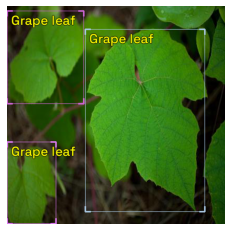

In [22]:
show_record(train_records[0], class_map=class_map, font_size=25,
            label_color = '#ffff00')

In [23]:
train_records[0]

BaseRecord

common: 
	- Image size ImgSize(width=416, height=416)
	- Filepath: train/grape-leaves1_jpg.rf.44cb149f600814dbf69015b0e0e0158b.jpg
	- Img: None
	- Record ID: 616
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Corn rust leaf': 1, 'Corn leaf blight': 2, 'Tomato leaf late blight': 3, 'Apple Scab Leaf': 4, 'Tomato Septoria leaf spot': 5, 'Tomato mold leaf': 6, 'Bell_pepper leaf spot': 7, 'Potato leaf early blight': 8, 'grape leaf black rot': 9, 'Tomato leaf yellow virus': 10, 'Blueberry leaf': 11, 'Bell_pepper leaf': 12, 'Apple rust leaf': 13, 'Tomato leaf bacterial spot': 14, 'Raspberry leaf': 15, 'Squash Powdery mildew leaf': 16, 'Potato leaf late blight': 17, 'Tomato leaf mosaic virus': 18, 'Tomato Early blight leaf': 19, 'Soybean leaf': 20, 'Tomato leaf': 21, 'Peach leaf': 22, 'Soyabean leaf': 23, 'Corn Gray leaf spot': 24, 'Apple leaf': 25, 'Strawberry leaf': 26, 'Cherry leaf': 27, 'grape leaf': 28, 'Potato leaf': 29, 'Tomato two spotted spider mites leaf': 30}>
	

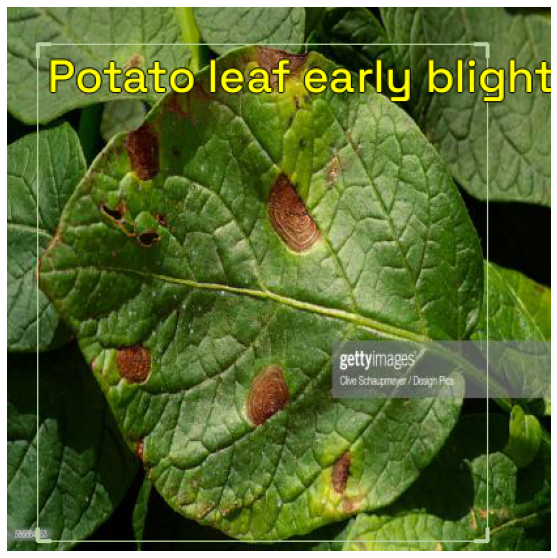

In [28]:
show_record(train_records[2], class_map=class_map, font_size=35,
            label_color = '#ffff00',
            figsize=(14,10))

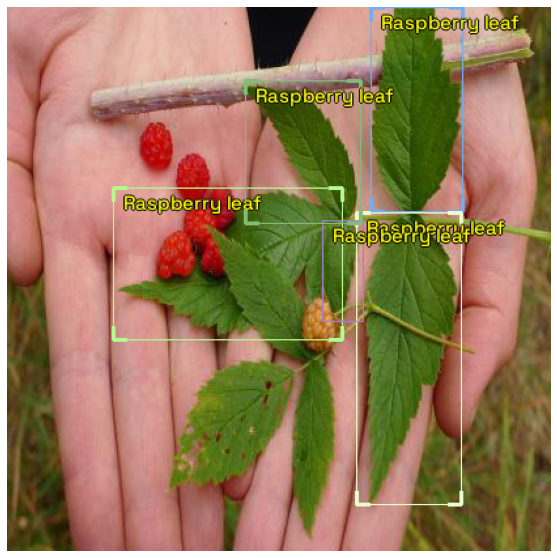

In [35]:
show_record(train_records[4], class_map=class_map, font_size=15,
            label_color = '#ffff00',
            figsize=(14,10))

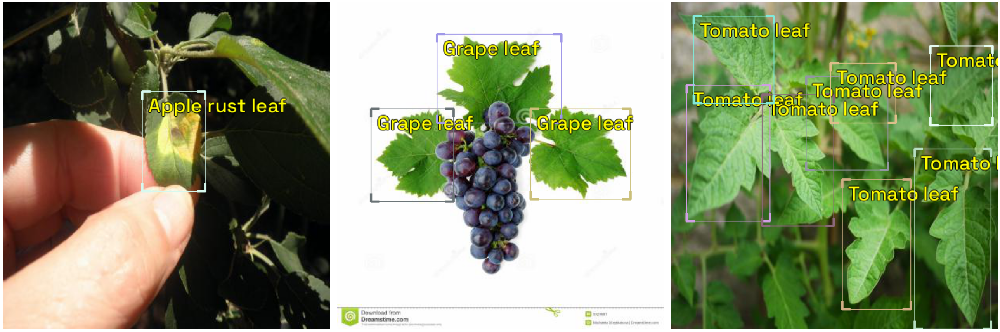

In [37]:
show_records(train_records[10:13], ncols =3, class_map=class_map,
              font_size=25,
            label_color = '#ffff00')

In [26]:
image_size = 384
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=512), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(image_size), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

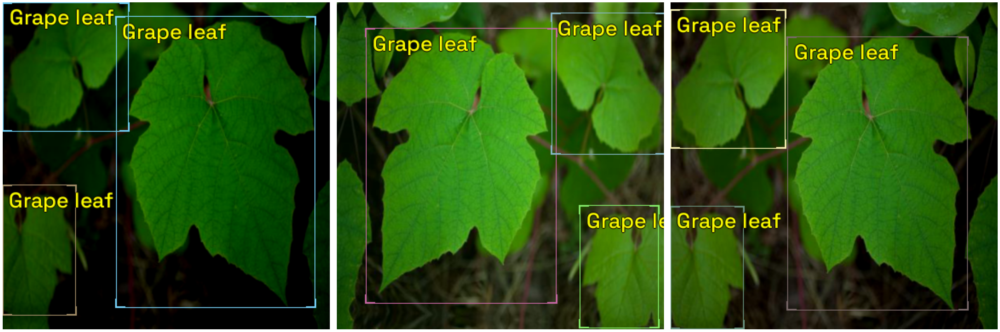

In [27]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py

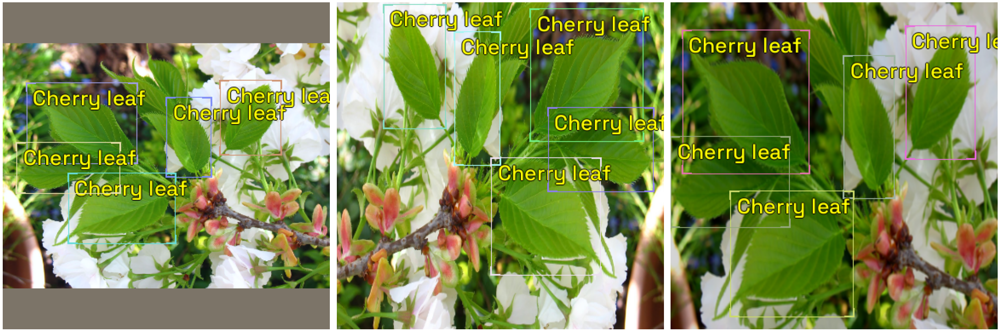

In [ ]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#ffff00')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py

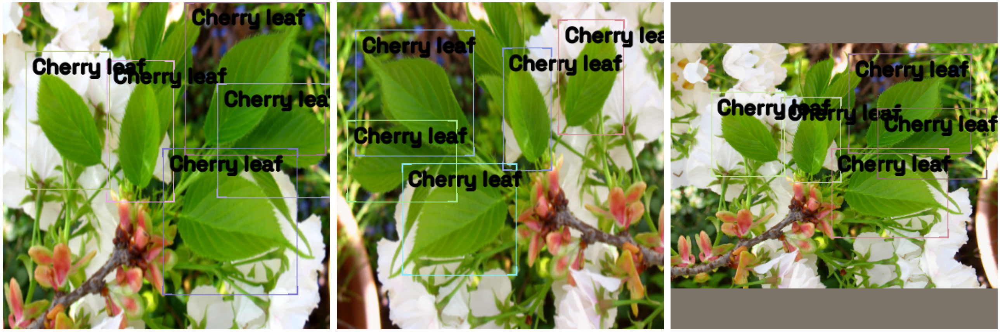

In [ ]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, class_map = class_map, 
             denormalize_fn = denormalize_imagenet, ncols=3,
             font_size=25, label_color = '#000000')
# https://github.com/yrodriguezmd/icevision/blob/master/icevision/visualize/show_data.py